In [1]:
#Import Necessary Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('seaborn-darkgrid')
from sklearn.model_selection import *
from sklearn.metrics import *
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier, LGBMRegressor, LGBMClassifier
from sklearn.ensemble import ExtraTreesClassifier
from tqdm import tqdm_notebook
from xgboost import XGBRegressor
from sklearn.model_selection import KFold,StratifiedKFold, TimeSeriesSplit, GroupKFold
from sklearn.metrics import mean_squared_error

import warnings
warnings.filterwarnings('ignore')

In [2]:
#!pip install xgboost
#!pip install category-encoders

In [3]:
#Import Dataset
train = pd.read_csv('Train.csv')
print(f"train data shape is: {train.shape}")
test = pd.read_csv('Test.csv')
print(f"test data shape is: {test.shape}")
sub = pd.read_csv('SampleSubmission.csv')

train data shape is: (21454, 19)
test data shape is: (7194, 18)


In [4]:
#Read Dataset
train.head()

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline,Target
0,ID_AAIethGy,Ethiopia,2016,R,0.0,0.000000,0.000000,0.000055,0.000536,0.999408,12.146134,25.489659,0.879484,0.000000,0.000000,0.000000,278.788451,769.338378,0.132783
1,ID_AAYiaCeL,Ethiopia,2005,R,0.0,0.000000,0.000110,0.000000,0.000018,0.999872,113.806716,64.136053,0.601427,0.000000,0.005427,0.000000,200.986978,337.135243,0.004898
2,ID_AAdurmKj,Mozambique,2009,R,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,4.400096,0.131900,0.000000,0.003078,0.000000,642.594208,169.913773,0.097320
3,ID_AAgNHles,Malawi,2015,R,0.0,0.000141,0.000181,0.000254,0.000228,0.999195,5.213320,25.379371,2.017136,11.293841,0.131035,0.000000,365.349451,613.591610,0.304107
4,ID_AAishfND,Guinea,2012,U,0.0,0.011649,0.017560,0.017383,0.099875,0.853533,31.734661,5.081620,22.815984,0.005047,0.130475,1.461894,222.867189,192.926363,0.605328


In [5]:
test.head()

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline
0,ID_AAcismbB,Democratic Republic of Congo,2007,R,0.000000,0.000000,0.000000,0.000523,0.000131,0.999347,0.660758,0.990942,0.132264,0.069055,0.032627,0.000000,1249.294720,1364.592100
1,ID_AAeBMsji,Democratic Republic of Congo,2007,U,0.000000,0.004239,0.000238,0.001227,0.002860,0.991437,6.441547,5.461365,0.452400,0.000000,0.000000,0.000000,821.019579,1046.028681
2,ID_AAjFMjzy,Uganda,2011,U,0.007359,0.525682,0.132795,0.095416,0.042375,0.196373,587.516458,2.881811,87.387991,3.248483,3.950374,60.070041,3.620455,906.057334
3,ID_AAmMOEEC,Burkina Faso,2010,U,0.000000,0.000089,0.000036,0.001519,0.001358,0.996997,35.141762,33.878927,4.166437,0.000000,0.130727,1.333999,109.493969,775.139189
4,ID_ABguzDxp,Zambia,2007,R,0.000000,0.000138,0.000623,0.000615,0.002961,0.995663,3.442449,33.491994,3.437129,0.133563,0.128997,0.502203,133.643319,835.591501


## EDA

### Quick EDA with Pandas-Profiling which provides a detailed overview on the data, including information on the missing values,unique entries per columns and some basic plots

In [6]:
import pandas_profiling as pp
pp.ProfileReport(train)

<AxesSubplot:xlabel='nighttime_lights', ylabel='Target'>

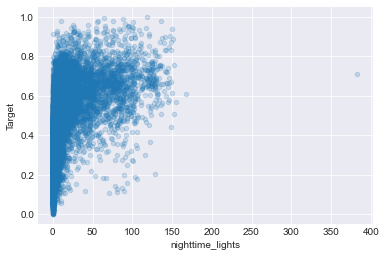

In [7]:
# Plotting the relationship between an input column and the target
train.plot(x='nighttime_lights', y='Target', kind='scatter', alpha=0.2)

<AxesSubplot:xlabel='nighttime_lights', ylabel='nighttime_lights'>

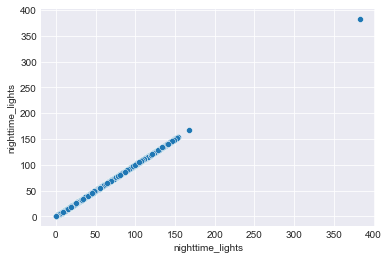

In [8]:
sns.scatterplot(x='nighttime_lights', y='nighttime_lights', data=train)

## Feature Engineering

In [9]:

test['country_map'] = test['country'].replace({'Democratic Republic of Congo':'Central', 'Uganda':'East', 'Burkina Faso':'West', 'Zambia':'East', 'Angola':'Central', 'Zimbabwe':'South', 'Benin':'West'})

train['country_map'] = train['country'].replace({'Ethiopia':'West', 'Mozambique':'East', 'Malawi':'East', 'Guinea':'West', 'Cameroon':'Central', 'Ghana':'West', 'Senegal':'West', 'Kenya':'East', 'Tanzania':'East', 'Mali':'West',
       'Swaziland':'South', 'Rwanda':'East', 'Nigeria':'West', 'Lesotho':'South', 'Sierra Leone':'West', 'Central African Republic':'Central', "Cote d'Ivoire":'West',
       'Togo':'West'})

In [10]:
len_train = len(train)
data = pd.concat([train, test]).reset_index(drop=True)

In [11]:
data['country_freq'] = data['country'].map(data['country'].value_counts())
data['year_freq'] = data['year'].map(data['year'].value_counts())
data['urban_or_rural_freq'] = data['urban_or_rural'].map(data['urban_or_rural'].value_counts())

In [12]:
data['total_ghsl_pre'] = data['ghsl_built_pre_1975']+data['ghsl_built_1975_to_1990']+data['ghsl_built_1990_to_2000']+data['ghsl_built_2000_to_2014']
data['total_landcover_fraction'] = data['landcover_crops_fraction']+data['landcover_urban_fraction']
data['total_landcover_water'] = data['landcover_water_permanent_10km_fraction'] + data['landcover_water_seasonal_10km_fraction']

In [13]:
def create_bin_features(input_df, features):
    for bin_fe in features:
        print("Binning: ",bin_fe)
        input_df[bin_fe+"_BINS"] = pd.qcut(input_df[bin_fe], 4, labels=False, duplicates='drop')
    
    return input_df

In [14]:
binning_num_features = ['nighttime_lights']

data = create_bin_features(data, binning_num_features)

Binning:  nighttime_lights


In [15]:
poly = data[['ghsl_water_surface',
       'ghsl_built_pre_1975', 'ghsl_built_1975_to_1990',
       'ghsl_built_1990_to_2000', 'ghsl_built_2000_to_2014','nighttime_lights']]

In [16]:
from sklearn.preprocessing import PolynomialFeatures

pf = PolynomialFeatures(
degree=2,
interaction_only=False,
include_bias=False
)
pf.fit(poly)

# create polynomial features
poly_feats = pf.transform(poly)

In [17]:
# create a dataframe with all the features
num_feats = poly_feats.shape[1]
df_transformed = pd.DataFrame(
poly_feats,
columns=[f"f_{i}" for i in range(1, num_feats + 1)]
)

In [18]:
df_transformed.drop(columns=['f_1', 'f_2', 'f_3', 'f_4', 'f_5','f_6'], inplace=True)

In [19]:
data = pd.concat([data, df_transformed],axis=1)

In [20]:
train = data[:len_train]
test = data[len_train:]

In [21]:
train['min_distance_loc'] = train.groupby(['country_map','urban_or_rural'])['dist_to_capital'].transform('min')
train['max_distance_loc'] = train.groupby(['country_map','urban_or_rural'])['dist_to_capital'].transform('max')

test['min_distance_loc'] = test.groupby(['country_map','urban_or_rural'])['dist_to_capital'].transform('min')
test['max_distance_loc'] = test.groupby(['country_map','urban_or_rural'])['dist_to_capital'].transform('max')

In [22]:
from category_encoders.target_encoder import TargetEncoder
TE_encoder = TargetEncoder()
train['urban_encode'] = TE_encoder.fit_transform(train['urban_or_rural'], train['Target'])
test['urban_encode'] = TE_encoder.transform(test['urban_or_rural'])

In [23]:
train['urban_or_rural'] = train['urban_or_rural'].replace({'U':1, 'R':0})
test['urban_or_rural'] = test['urban_or_rural'].replace({'U':1, 'R':0})

In [24]:
X = train.drop(columns=['ID', 'Target','urban_or_rural','country'])
y = train['Target']
tes = test.drop(columns=['ID','Target','urban_or_rural','country'])

In [25]:
cate_features_index = np.where(X.dtypes == 'object') [0]; cate_features_index

array([15])

# Modelling

In [26]:
%%time
folds = KFold(n_splits=10, shuffle=True, random_state=1234)
oofs = np.zeros((len(X)))
preds = np.zeros((len(test)))

from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score

for fold_, (trn_idx, val_idx) in enumerate(folds.split(X, y)):
    
    X_trn, y_trn = X.iloc[trn_idx], y.iloc[trn_idx]
    X_val, y_val = X.iloc[val_idx], y.iloc[val_idx]
    

    clf = CatBoostRegressor(learning_rate=0.02,  n_estimators=3200, random_seed=2021, use_best_model=True,
                       colsample_bylevel=0.5,subsample=0.85,eval_metric='RMSE',l2_leaf_reg=4, cat_features=cate_features_index)
    clf.fit(X_trn, y_trn, eval_set = [(X_val, y_val)], verbose = 500, early_stopping_rounds = 100)
    
    vp = clf.predict(X_val)
    val_score = np.sqrt(mean_squared_error((vp), (y_val)))
    
    print(f'\nFold {fold_+1} Val score: {val_score}\n')
    
    tp = clf.predict(tes)
    
    oofs[val_idx] = vp
    preds += tp/10

    
oof_score = np.sqrt(mean_squared_error((y), (oofs)))
print(f'\nOOF RMSE is : {oof_score}')

0:	learn: 0.1918595	test: 0.1918846	best: 0.1918846 (0)	total: 68.8ms	remaining: 3m 40s
500:	learn: 0.0863782	test: 0.0900303	best: 0.0900303 (500)	total: 7.54s	remaining: 40.6s
1000:	learn: 0.0816351	test: 0.0878773	best: 0.0878773 (1000)	total: 14.7s	remaining: 32.4s
1500:	learn: 0.0787649	test: 0.0871860	best: 0.0871833 (1499)	total: 20.6s	remaining: 23.3s
2000:	learn: 0.0763502	test: 0.0867919	best: 0.0867919 (2000)	total: 26.6s	remaining: 15.9s
2500:	learn: 0.0743748	test: 0.0864463	best: 0.0864463 (2500)	total: 32.5s	remaining: 9.08s
3000:	learn: 0.0725966	test: 0.0862307	best: 0.0862301 (2995)	total: 37.8s	remaining: 2.5s
3199:	learn: 0.0718864	test: 0.0861173	best: 0.0861144 (3176)	total: 40s	remaining: 0us

bestTest = 0.08611438771
bestIteration = 3176

Shrink model to first 3177 iterations.

Fold 1 Val score: 0.08611438733732389

0:	learn: 0.1920955	test: 0.1896681	best: 0.1896681 (0)	total: 7.93ms	remaining: 25.4s
500:	learn: 0.0863503	test: 0.0888634	best: 0.0888634 (500)	t

In [27]:
oof_score = np.round(np.sqrt(mean_squared_error((y), (oofs))),4)
print(f'\nOOF RMSE is : {oof_score}')


OOF RMSE is : 0.0851


In [28]:
pred = np.mean(oof_score)
sub['Target'] = pred
sub.head()

,ID,Target
0,ID_AAcismbB,0.0851
1,ID_AAeBMsji,0.0851
2,ID_AAjFMjzy,0.0851
3,ID_AAmMOEEC,0.0851
4,ID_ABguzDxp,0.0851


In [29]:
sub.to_csv('AC.csv', index=False)

In [30]:
#Economic_CSV
from catboost import CatBoostRegressor
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3, shuffle=True, random_state=42)
clf = CatBoostRegressor(learning_rate=0.02,  n_estimators=3300, random_seed=2021, use_best_model=True,
                       colsample_bylevel=0.5,subsample=0.85,eval_metric='RMSE',l2_leaf_reg=4, cat_features=cate_features_index)
clf.fit(X, y, eval_set = [(X_val, y_val)], verbose = 500, early_stopping_rounds = 100)

0:	learn: 0.1918662	test: 0.1901499	best: 0.1901499 (0)	total: 10.6ms	remaining: 35s
500:	learn: 0.0865785	test: 0.0863488	best: 0.0863488 (500)	total: 4.87s	remaining: 27.2s
1000:	learn: 0.0824545	test: 0.0819416	best: 0.0819416 (1000)	total: 9.65s	remaining: 22.2s
1500:	learn: 0.0795849	test: 0.0789242	best: 0.0789242 (1500)	total: 14.4s	remaining: 17.3s
2000:	learn: 0.0771948	test: 0.0765985	best: 0.0765985 (2000)	total: 19.1s	remaining: 12.4s
2500:	learn: 0.0751491	test: 0.0745397	best: 0.0745397 (2500)	total: 24s	remaining: 7.65s
3000:	learn: 0.0733923	test: 0.0728316	best: 0.0728316 (3000)	total: 29.5s	remaining: 2.94s
3299:	learn: 0.0724120	test: 0.0718867	best: 0.0718867 (3299)	total: 32.5s	remaining: 0us

bestTest = 0.07188669999
bestIteration = 3299



In [31]:
#Economic_CSV
preds = clf.predict(tes)
sub['Target'] = preds
sub.to_csv('economic.csv', index=False)